<a href="https://colab.research.google.com/github/milosbozic/garbage_detection/blob/main/Dataset_analysis_and_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Install TF object detection API

In [1]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3024, done.
remote: Counting objects: 100% (3024/3024), done.
remote: Compressing objects: 100% (2561/2561), done.
remote: Total 3024 (delta 756), reused 1304 (delta 424), pack-reused 0
Receiving objects: 100% (3024/3024), 33.24 MiB | 20.19 MiB/s, done.
Resolving deltas: 100% (756/756), done.


In [2]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1675727 sha256=61a75a48a1157e4db9cdd138a3b245699e92b2f057f252da914884328024fd01
  Stored in directory: /tmp/pip-ephem-wheel-cache-qxjrs0xs/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=d2fc11002e89d9f91e0d63775a00681799dfe649fd4877d403a620f7dbfefa1e
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=3d8e7b48cb7ca05eeb6eab96675f4f91bdefc0d80943475604ed03dc6adf4419
  Stored in directory: /root/.cache/pip/wheels/bc/49/5f/fdb5b9d85055c478213e0158ac122b596816149a02d82e0ab1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78546 sha256=e06ab15626f56260f0466ba2a1a860071db665e95d840a805

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
#!pip install -U --pre tensorflow

### Mount G_drive

In [3]:
# Mount Drive 

from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Do all imports

In [4]:
# All imports

from os import listdir
from os.path import isfile, join
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [13]:
# Images folder
images_folder = '/content/gdrive/MyDrive/Work/garbage_detector/data/20210605_001_training'
# Annotation folder
annotation_folder = '/content/gdrive/MyDrive/Work/garbage_detector/data/20210605_001_training'
# Label map file
PATH_TO_LABELS = "/content/gdrive/MyDrive/Work/garbage_detector/data/label_map.pbtxt"

In [10]:
# Get all annotation files from folder
annot_files = [f for f in listdir(annotation_folder) if (isfile(join(annotation_folder, f)) and (f.endswith('.xml')))]

In [11]:
len(annot_files)

2268

In [5]:
def read_VOC_content(xml_file: str):
    """ Read VOC annotation format from xml files

        Args:
          xml_file(str) : path to xml file in VOC format
        
        Output:
          (dict) :  height # Image height
                    width  # Image width
                    depth  # Number of image chanels
                    filename  # Filename of the image. Empty if image is not from file
                    encoded_image_data # Encoded image bytes
                    image_format # b'jpeg' or b'png'

                    xmins # List of normalized left x coordinates in bounding box (1 per box)
                    xmaxs # List of normalized right x coordinates in bounding box (1 per box)
                    ymins # List of normalized top y coordinates in bounding box (1 per box)
                    ymaxs # List of normalized bottom y coordinates in bounding box # (1 per box)
                    classes_text # List of string class name of bounding box (1 per box)

    """

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text

    if filename[-3:] == 'png':
      image_format = b'png'
    elif filename[-4:] == 'jpeg':
      image_format = b'jpeg'
    elif filename[-3:] == 'jpg':
      image_format = b'jpeg'
    else:
      image_format = None

    width = int(root.find("size/width").text)
    height = int(root.find("size/height").text)
    depth = int(root.find("size/depth").text)
    encoded_image_data = None

    xmins = []
    ymins = []
    xmaxs = []
    ymaxs = []
    classes_text = []

    # Iterate through objects on image
    for boxes in root.iter('object'):

      classes_text.append(str(boxes.find("name").text))

      ymins.append(int(float(boxes.find("bndbox/ymin").text)))
      xmins.append(int(float(boxes.find("bndbox/xmin").text)))
      ymaxs.append(int(float(boxes.find("bndbox/ymax").text)))
      xmaxs.append(int(float(boxes.find("bndbox/xmax").text)))

    annot = {'filename':filename, 'width':width, 'height':height, 'depth':depth, 'xmins':xmins, 
             'xmaxs':xmaxs, 'ymins':ymins, 'ymaxs':ymaxs, 'classes_text':classes_text, 
             'encoded_image_data':encoded_image_data, 'image_format':image_format}

    return annot


In [12]:
# Test VOC format reader ie. read_contect method
annot = read_VOC_content(join(images_folder, annot_files[1000]))
annot

{'classes_text': ['plastic_bag_color',
  'plastic_bag_color',
  'plastic_foil',
  'plastic_foil'],
 'depth': 3,
 'encoded_image_data': None,
 'filename': 'LKW-ddac6350_lkw-bio-abfall_20210504-084322-20660016_47a08580-515a-491d-b327-7ac3a2bb02b3.jpg',
 'height': 1080,
 'image_format': b'jpeg',
 'width': 1920,
 'xmaxs': [608, 715, 879, 1348],
 'xmins': [393, 584, 685, 1099],
 'ymaxs': [703, 756, 795, 793],
 'ymins': [525, 572, 625, 552]}

In [63]:
def read_VOC_content_for_ODAPI(xml_file: str, category_index = None):
    """ Read VOC annotation format from xml files in format for Obejct Detection API direct use

        Args:
          xml_file(str) : path to xml file in VOC format
          category_index (dict): Indexes for coresponding category names in dict format

        Output:
          (dict) :  height # Image height
                    width  # Image width
                    depth  # Number of image chanels
                    filename  # Filename of the image. Empty if image is not from file
                    encoded_image_data # Encoded image bytes
                    image_format # b'jpeg' or b'png'

                    object_classes # NumPy array of categories indexes [1, 4, 6, ...]
                    object_boxes # NumPy array of box coordinates [[ymin, xmin, ymax, xmax],...]
                    object_categories # List of class names of bounding box (1 per box) [cat_name1, cat_name2, ...]

    """

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text

    if filename[-3:] == 'png':
      image_format = b'png'
    elif filename[-4:] == 'jpeg':
      image_format = b'jpeg'
    elif filename[-3:] == 'jpg':
      image_format = b'jpeg'
    else:
      image_format = None

    width = int(root.find("size/width").text)
    height = int(root.find("size/height").text)
    depth = int(root.find("size/depth").text)
    encoded_image_data = None

    object_boxes = []
    object_categories = []
    object_classes = []

    # Iterate through objects on image
    for boxes in root.iter('object'):

      object_categories.append(str(boxes.find("name").text))

      if category_index is not None:
        for x in category_index.values():
          if x['name'] == str(boxes.find("name").text):
            object_classes.append(int(x['id']))
            break

      ymin = (int(float(boxes.find("bndbox/ymin").text)))
      xmin = (int(float(boxes.find("bndbox/xmin").text)))
      ymax = (int(float(boxes.find("bndbox/ymax").text)))
      xmax = (int(float(boxes.find("bndbox/xmax").text)))

      object_boxes.append([ymin, xmin, ymax, xmax])

    annot = {'filename':filename, 'width':width, 'height':height, 'depth':depth, 
             'object_classes':np.array(object_classes), 'object_boxes':np.array(object_boxes), 'object_categories':object_categories,
             'encoded_image_data':encoded_image_data, 'image_format':image_format}

    return annot

In [64]:
# Test VOC format reader in Object Detection API
annot = read_VOC_content_for_ODAPI(join(images_folder, annot_files[1000]), category_index)
annot

{'depth': 3,
 'encoded_image_data': None,
 'filename': 'LKW-ddac6350_lkw-bio-abfall_20210504-084322-20660016_47a08580-515a-491d-b327-7ac3a2bb02b3.jpg',
 'height': 1080,
 'image_format': b'jpeg',
 'object_boxes': array([[ 525,  393,  703,  608],
        [ 572,  584,  756,  715],
        [ 625,  685,  795,  879],
        [ 552, 1099,  793, 1348]]),
 'object_categories': ['plastic_bag_color',
  'plastic_bag_color',
  'plastic_foil',
  'plastic_foil'],
 'object_classes': array([8, 8, 6, 6]),
 'width': 1920}

# Data set analysis

In [ ]:
# Read all annotation files and make dataframe for later analysis

dataset = {'filename':[], 'image_width':[], 'image_height':[], 'ymin':[], 'xmin':[], 'ymax':[], 'xmax':[], 'category':[]}

for annot_file in annot_files:
  annot = read_VOC_content(join(images_folder, annot_file))
  
  width = annot['width']
  height = annot['height']
  filename = annot['filename']

  for i in range(len(annot['classes_text'])):
    name = annot['classes_text'][i]
    xmin = annot['xmins'][i]
    ymin = annot['ymins'][i]
    xmax = annot['xmaxs'][i]
    ymax = annot['ymaxs'][i]

    dataset['filename'].append(filename)
    dataset['image_width'].append(width)
    dataset['image_height'].append(height)
    dataset['xmin'].append(xmin)
    dataset['ymin'].append(ymin)
    dataset['xmax'].append(xmax)
    dataset['ymax'].append(ymax)
    dataset['category'].append(name)


In [ ]:
df = pd.DataFrame(dataset)
df.head()

,filename,image_width,image_height,ymin,xmin,ymax,xmax,category
0,LKW-ddac6350_lkw-bio-abfall_20210504-083355-68...,1920,1080,455,664,618,900,plastic_bag
1,LKW-ddac6350_lkw-bio-abfall_20210504-102345-32...,1920,1080,325,935,559,1146,plastic_bag
2,LKW-ddac6350_lkw-bio-abfall_20210504-102345-32...,1920,1080,238,668,540,978,plastic_bag
3,LKW-ddac6350_lkw-bio-abfall_20210504-102345-32...,1920,1080,501,687,623,841,paper
4,LKW-ddac6350_lkw-bio-abfall_20210504-103038-27...,1920,1080,531,666,591,837,paper


In [ ]:
categories = df.category.unique()
categories

array(['plastic_bag', 'paper', 'paper_bag', 'plastic_pot', 'plastic_can',
       'plastic_foil', 'cardboard_box', 'plastic_bag_color',
       'bio_pumpkin', 'bio_bag_exp', 'pet_trans', 'plastic_mkf_p',
       'bio_bag_comp', 'cardboard', 'plastic', 'metal_can',
       'plastic_pod_s', 'cardboard_gvk_p', 'plastic_mkf',
       'cardboard_package', 'cardboard_box_pizza', 'pet_green'],
      dtype=object)

#### -- Check distribution of categories in dataset

In [ ]:
# Distribution of categories 

cat_dist = df['category'].value_counts()
cat_dist

plastic_bag            2870
paper                  1770
paper_bag               386
plastic_foil            357
plastic_bag_color       191
cardboard_box            47
plastic_can              39
plastic_pot              27
bio_pumpkin              18
plastic_pod_s            14
cardboard                14
bio_bag_exp              14
pet_trans                13
plastic                   8
metal_can                 4
bio_bag_comp              4
cardboard_package         3
plastic_mkf_p             3
cardboard_gvk_p           2
cardboard_box_pizza       1
plastic_mkf               1
pet_green                 1
Name: category, dtype: int64

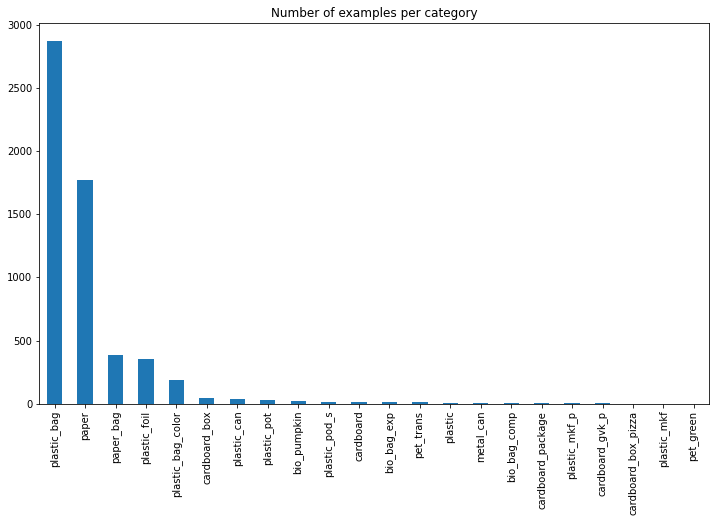

In [ ]:
cat_dist.plot.bar(figsize=(12,7), title='Number of examples per category')

#### -- Check objects size and aspect ratio 

In [ ]:
df['box_width'] =  df['ymax'] - df['ymin']
df['box_height'] =  df['xmax'] - df['xmin']
df['box_ratio'] = df['box_height'] / df['box_width']
df.head()

,filename,image_width,image_height,ymin,xmin,ymax,xmax,category,box_width,box_height,box_ratio
0,LKW-ddac6350_lkw-bio-abfall_20210504-083355-68...,1920,1080,455,664,618,900,plastic_bag,163,236,1.447853
1,LKW-ddac6350_lkw-bio-abfall_20210504-102345-32...,1920,1080,325,935,559,1146,plastic_bag,234,211,0.901709
2,LKW-ddac6350_lkw-bio-abfall_20210504-102345-32...,1920,1080,238,668,540,978,plastic_bag,302,310,1.026490
3,LKW-ddac6350_lkw-bio-abfall_20210504-102345-32...,1920,1080,501,687,623,841,paper,122,154,1.262295
4,LKW-ddac6350_lkw-bio-abfall_20210504-103038-27...,1920,1080,531,666,591,837,paper,60,171,2.850000


* Bosex size distributions

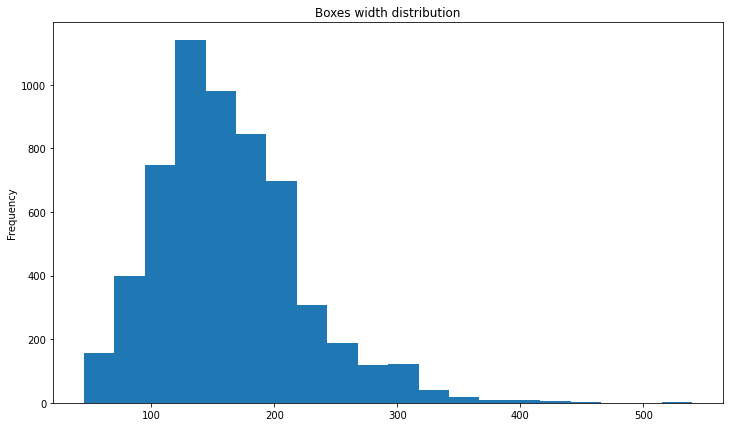

In [ ]:
df['box_width'].plot.hist(bins=20, figsize=(12,7), title='Boxes width distribution')

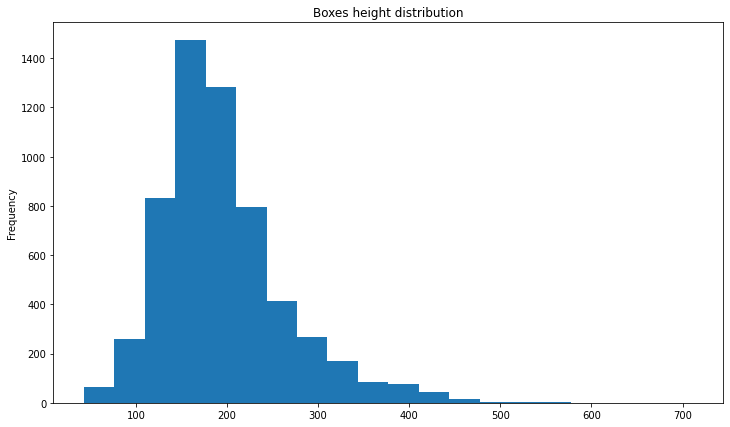

In [ ]:
df['box_height'].plot.hist(bins=20, figsize=(12,7), title='Boxes height distribution')

* Aspect rations distributions of all boxes

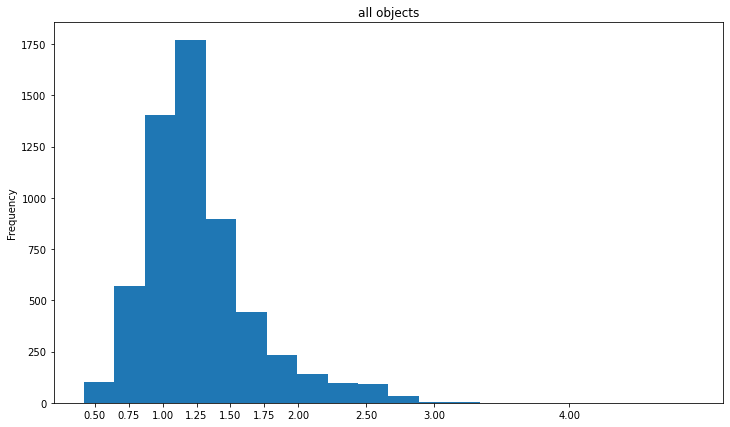

In [ ]:
df['box_ratio'].plot.hist(bins=20, xticks=[0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.5, 3, 4], figsize=(12,7), title='all objects')

* Aspect ration distributiof of __**plastic_bag**__

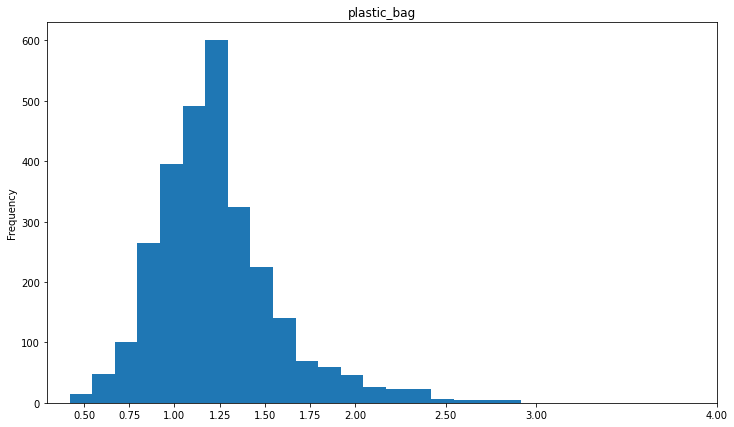

In [ ]:
df[df['category'] == 'plastic_bag']['box_ratio'].plot.hist(bins=20, xticks=[0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.5, 3, 4], figsize=(12,7), title='plastic_bag')

* Aspect ration distributiof of __**paper**__

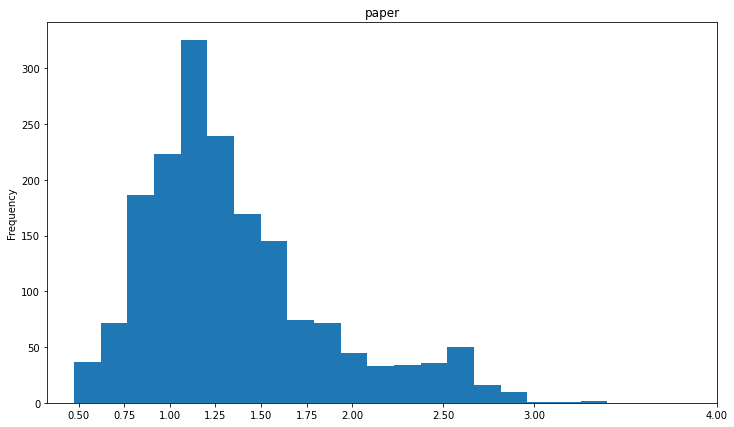

In [ ]:
df[df['category'] == 'paper']['box_ratio'].plot.hist(bins=20, xticks=[0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.5, 3, 4], figsize=(12,7), title='paper')

Aspect ration distributiof of __**paper_bag**__

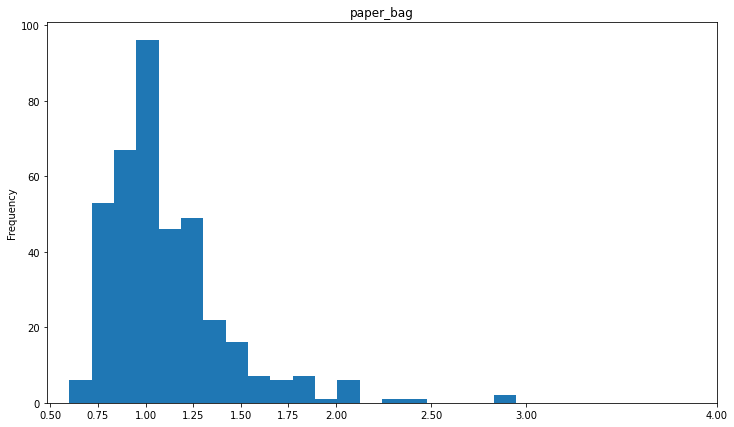

In [ ]:
df[df['category'] == 'paper_bag']['box_ratio'].plot.hist(bins=20, xticks=[0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.5, 3, 4], figsize=(12,7), title='paper_bag')

Aspect ration distributiof of __**plastic_foil**__

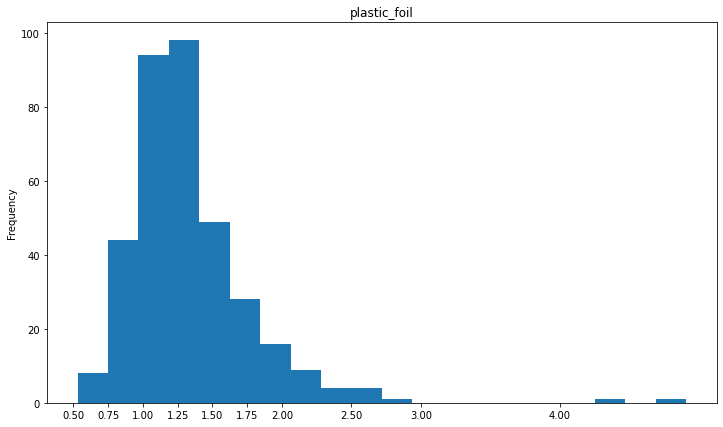

In [ ]:
df[df['category'] == 'plastic_foil']['box_ratio'].plot.hist(bins=20, xticks=[0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.5, 3, 4], figsize=(12,7), title='plastic_foil')

### Visualization  

#### Custom method for vizualisation

In [ ]:
def draw_bbox_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color='green',
                               thickness=4,
                               display_str_list=(),
                               use_normalized_coordinates=True):
  """Adds a bounding box to an image.
  Bounding box coordinates can be specified in either absolute (pixel) or
  normalized coordinates by setting the use_normalized_coordinates argument.
  Each string in display_str_list is displayed on a separate line above the
  bounding box in black text on a rectangle filled with the input 'color'.
  If the top of the bounding box extends to the edge of the image, the strings
  are displayed below the bounding box.
  Args:
    image: a PIL.Image object.
    ymin: ymin of bounding box.
    xmin: xmin of bounding box.
    ymax: ymax of bounding box.
    xmax: xmax of bounding box.
    color: color to draw bounding box. Default is red.
    thickness: line thickness. Default value is 4.
    display_str_list: list of strings to display in box
                      (each to be shown on its own line).
    use_normalized_coordinates: If True (default), treat coordinates
      ymin, xmin, ymax, xmax as relative to the image.  Otherwise treat
      coordinates as absolute.
  """
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  if use_normalized_coordinates:
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                  ymin * im_height, ymax * im_height)
  else:
    (left, right, top, bottom) = (xmin, xmax, ymin, ymax)
  if thickness > 0:
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
               (left, top)],
              width=thickness,
              fill=color)
  try:
    font = ImageFont.truetype('arial.ttf', 32)
  except IOError:
    font = ImageFont.load_default()

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = bottom + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle(
        [(left, text_bottom - text_height - 2 * margin), (left + text_width,
                                                          text_bottom)],
        fill=color)
    draw.text(
        (left + margin, text_bottom - text_height - margin),
        display_str,
        fill='black',
        font=font)
    text_bottom -= text_height - 2 * margin

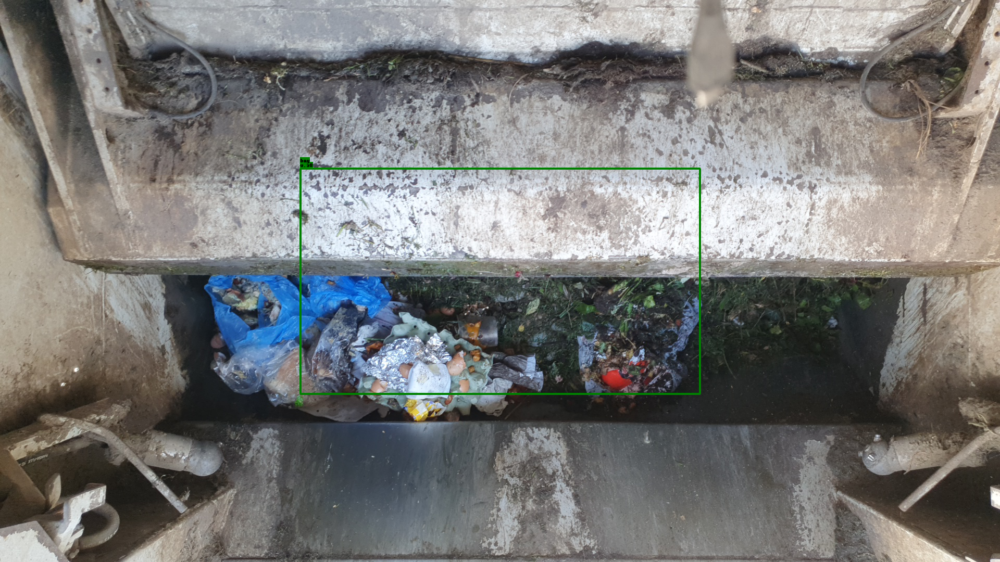

In [ ]:
# Test method draw_bbox_on_image on dammy data

annot = read_VOC_content(join(images_folder, annot_files[1000]))
img = Image.open(join(images_folder, annot['filename']))

image_pil = img.copy()
draw_bbox_on_image(image_pil,
                   0.3,
                   0.3,
                   0.7,
                   0.7,
                   display_str_list=['bag', '0.98'])
display(image_pil)

In [ ]:
def draw_bboxes_on_image(image,
                         boxes,
                         color='green',
                         thickness=4,
                         display_str_list_list=()):
  """Draws bounding boxes on image.
  Args:
    image: a PIL.Image object.
    boxes: a 2 dimensional numpy array of [N, 4]: (ymin, xmin, ymax, xmax).
           The coordinates are in normalized format between [0, 1].
    color: color to draw bounding box. Default is green.
    thickness: line thickness. Default value is 4.
    display_str_list_list: list of list of strings.
                           a list of strings for each bounding box.
                           The reason to pass a list of strings for a
                           bounding box is that it might contain
                           multiple labels.
  Raises:
    ValueError: if boxes is not a [N, 4] array
  """
  boxes_shape = boxes.shape
  if not boxes_shape:
    return
  if len(boxes_shape) != 2 or boxes_shape[1] != 4:
    raise ValueError('Input must be of size [N, 4]')
  for i in range(boxes_shape[0]):
    display_str_list = ()
    if display_str_list_list:
      display_str_list = display_str_list_list[i]
    draw_bbox_on_image(image, boxes[i, 0], boxes[i, 1], boxes[i, 2],
                               boxes[i, 3], color, thickness, display_str_list)

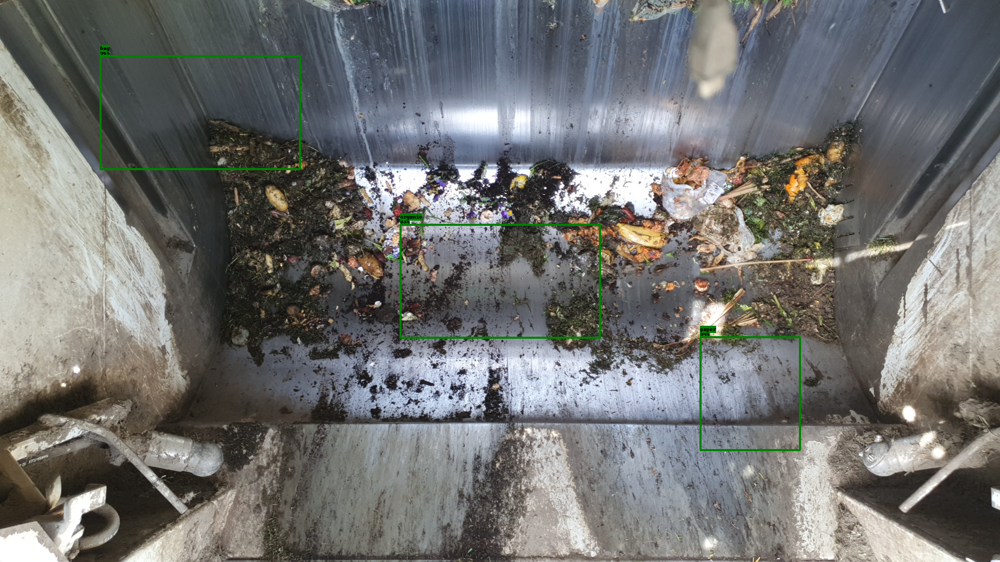

In [ ]:
# Test method draw_bboxes_on_image on dummy data

annot = read_VOC_content(join(images_folder, annot_files[500]))
img = Image.open(join(images_folder, annot['filename']))

bboxes_np = np.array([[0.1, 0.1, 0.3, 0.3],
                      [0.6, 0.7, 0.8, 0.8],
                      [0.4, 0.4, 0.6, 0.6]])

display_list_list = [['bag', '96%'], ['paper', '94%'], ['organic', '83%']]

image_pil = img.copy()
draw_bboxes_on_image(image_pil,
                     bboxes_np,
                   display_str_list_list=display_list_list)
display(image_pil)

{'filename': 'LKW-ddac6350_lkw-bio-abfall_20210504-111027-462436152_07135ce5-afd0-48d5-af51-c7ac188199c3.jpg', 'width': 1920, 'height': 1080, 'depth': 3, 'xmins': [1262], 'xmaxs': [1437], 'ymins': [304], 'ymaxs': [426], 'classes_text': ['plastic_bag'], 'encoded_image_data': None, 'image_format': b'jpeg'}


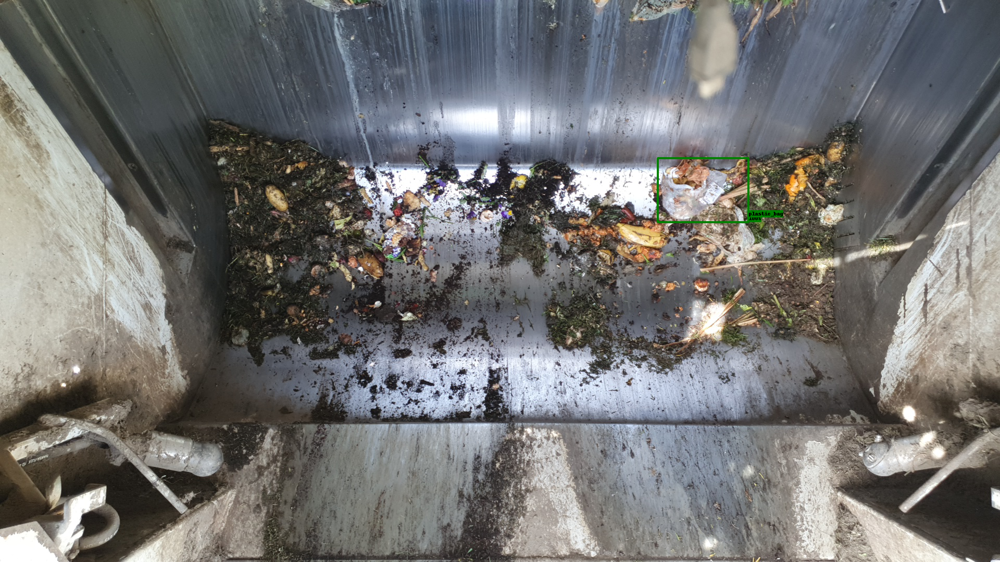

In [ ]:
# Test method draw_bboxes_on_image on real data

annot = read_VOC_content(join(images_folder, annot_files[500]))
print(annot)
img = Image.open(join(images_folder, annot['filename']))
display_list = []
boxes = []
width = annot['width']
height = annot['height']

for i, categoty in enumerate(annot['classes_text']):
  box = [annot['ymaxs'][i]/height, annot['xmaxs'][i]/width, annot['ymins'][i]/height, annot['xmins'][i]/width]
  boxes.append(box)
  display_list.append([categoty, '100%'])

boxes_np = np.array(boxes)

image_pil = img.copy()
draw_bboxes_on_image(image_pil,
                     boxes_np,
                     display_str_list_list=display_list)
display(image_pil)

#### Vizualisation using object detection API method

In [6]:
IMAGES_FOLDER = "/content/gdrive/MyDrive/Work/garbage_detector/data/test_voc"
IMAGE_FILE = "LKW-ddac6350_lkw-bio-abfall_20210422-064535-817128015_9a1eae2d-082a-4c82-b59b-d31281230e0b.jpg"
ANOT_FILE = "LKW-ddac6350_lkw-bio-abfall_20210422-064535-817128015_9a1eae2d-082a-4c82-b59b-d31281230e0b.xml"
label_id_offset = 1

In [65]:
annot = read_VOC_content_for_ODAPI(join(IMAGES_FOLDER, ANOT_FILE), category_index)

In [66]:
annot

{'depth': 3,
 'encoded_image_data': None,
 'filename': 'LKW-ddac6350_lkw-bio-abfall_20210422-064535-817128015_9a1eae2d-082a-4c82-b59b-d31281230e0b.jpg',
 'height': 1080,
 'image_format': b'jpeg',
 'object_boxes': array([[ 466,  813,  635,  981],
        [ 227,  698,  462,  921],
        [ 525,  605,  712,  755],
        [ 524,  719,  749,  888],
        [ 421,  624,  538,  814],
        [ 567,  961,  735, 1100]]),
 'object_categories': ['paper_bag',
  'paper',
  'paper',
  'paper',
  'paper',
  'paper'],
 'object_classes': array([3, 2, 2, 2, 2, 2]),
 'width': 1920}

In [67]:
image_np = np.array(Image.open(join(IMAGES_FOLDER, IMAGE_FILE)))

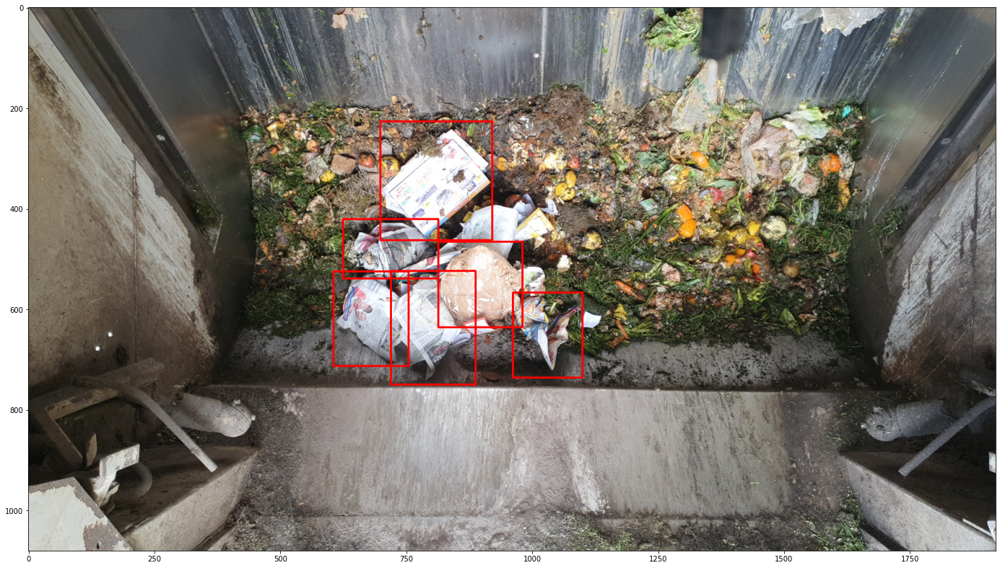

In [68]:
viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        annot['object_boxes'],
        annot['object_classes'],
        None,
        category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=200,
        min_score_thresh=.30,
        groundtruth_box_visualization_color='red',
        agnostic_mode=False)

plt.figure(figsize=(24, 16))
plt.imshow(image_np)
plt.show()